In [3]:
#Jory Hamilton
#06/09/2024
#AAI-510

#AI_TA helped with coding this assignment
#EDA Copied from Anova Youngers
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import seaborn as sns #data visualization

In [5]:
from google.colab import drive
drive.mount('/content/drive')

# Adjusted path if necessary
data_path = "/content/drive/MyDrive/AAI_510/Heart_Disease_Prediction.csv"
df = pd.read_csv(data_path)

# Rename the column "Heart Disease" to "HD"
df.rename(columns={'Heart Disease': 'HD'}, inplace=True)

print("First few rows of the dataset:")
print(df.head())

print("\nBasic information about the dataset:")
print(df.info())

print("\nSummary statistics of the dataset:")
print(df.describe())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
First few rows of the dataset:
   Age  Sex  Chest pain type   BP  Cholesterol  FBS over 120  EKG results  \
0   70    1                4  130          322             0            2   
1   67    0                3  115          564             0            2   
2   57    1                2  124          261             0            0   
3   64    1                4  128          263             0            0   
4   74    0                2  120          269             0            2   

   Max HR  Exercise angina  ST depression  Slope of ST  \
0     109                0            2.4            2   
1     160                0            1.6            2   
2     141                0            0.3            1   
3     105                1            0.2            2   
4     121                1            0.2            1   

   Number of vessels fluro  

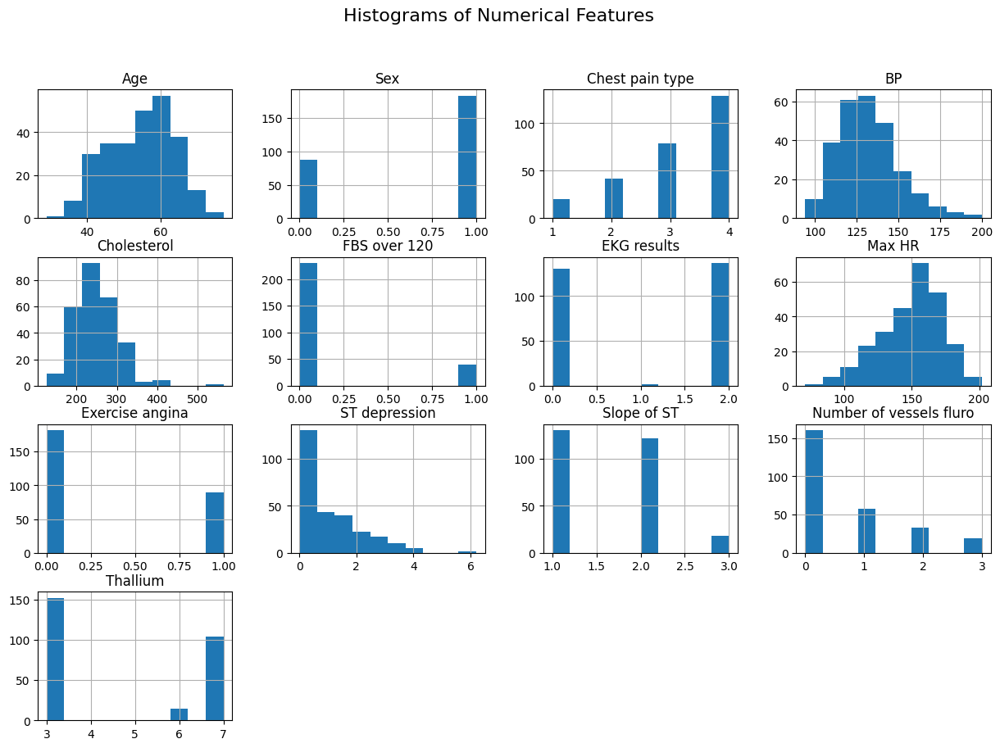

In [6]:
#Histograms for all numerical columns
df.hist(figsize=(15, 10))
plt.suptitle('Histograms of Numerical Features', fontsize=16)
plt.show()

In [7]:
# Now lets analyze and convert categorical features

df['HD'] = df['HD'].map({'Presence': 1, 'Absence': 0})

# Display the first few rows to confirm the conversion
print("Updated dataset with numerical target variable:")
print(df.head())

Updated dataset with numerical target variable:
   Age  Sex  Chest pain type   BP  Cholesterol  FBS over 120  EKG results  \
0   70    1                4  130          322             0            2   
1   67    0                3  115          564             0            2   
2   57    1                2  124          261             0            0   
3   64    1                4  128          263             0            0   
4   74    0                2  120          269             0            2   

   Max HR  Exercise angina  ST depression  Slope of ST  \
0     109                0            2.4            2   
1     160                0            1.6            2   
2     141                0            0.3            1   
3     105                1            0.2            2   
4     121                1            0.2            1   

   Number of vessels fluro  Thallium  HD  
0                        3         3   1  
1                        0         7   0  
2          

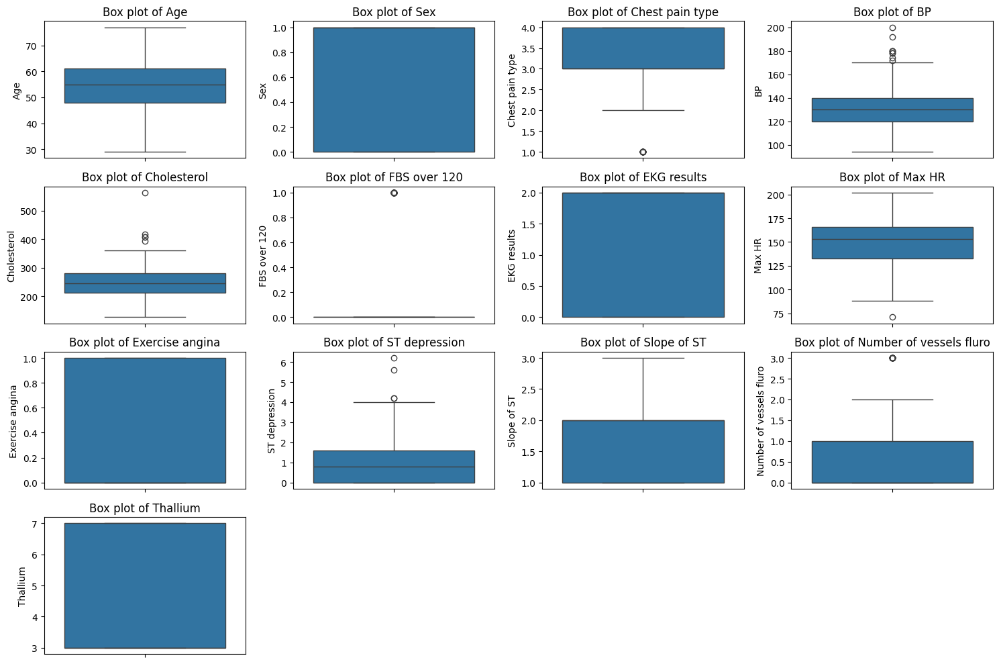

In [8]:
#Correlation analysis to identify potential outliers in the data
plt.figure(figsize=(15, 10))
for i, column in enumerate(df.columns[:-1], 1):
    plt.subplot(4, 4, i)
    sns.boxplot(y=df[column])
    plt.title(f'Box plot of {column}')
plt.tight_layout()
plt.show()

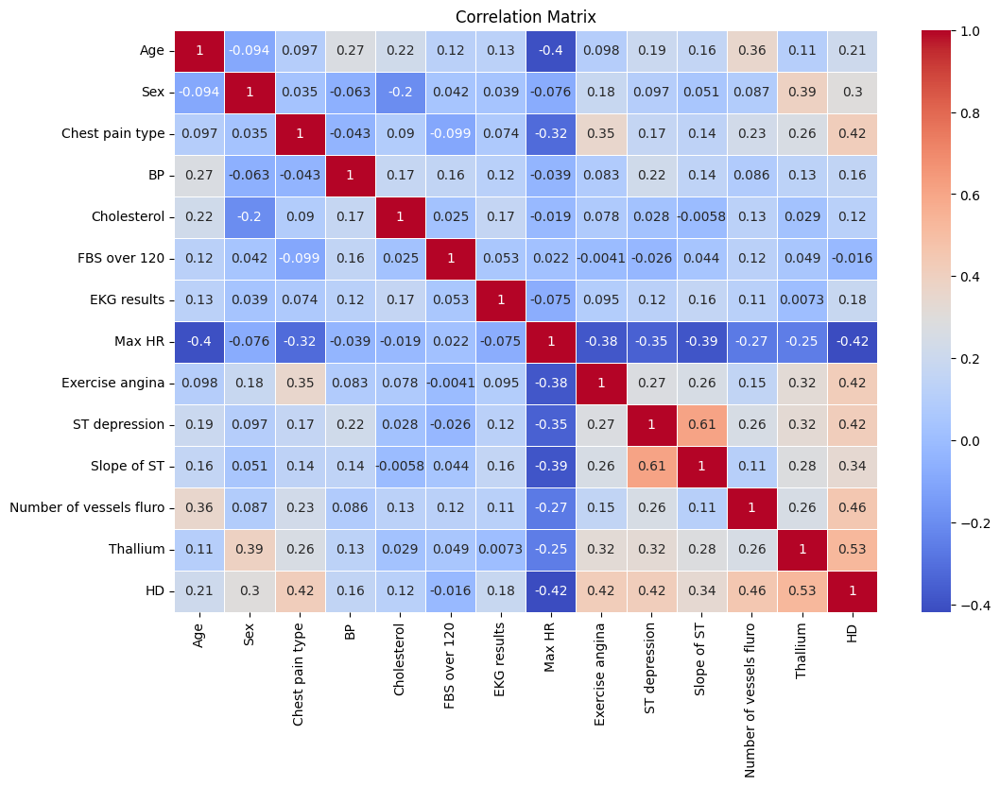

In [9]:
#correlation matrix
corr_matrix = df.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [10]:
#The function to cap outliers at the 95th percentile
def cap_outliers(df, columns):
    for col in columns:
        upper_limit = df[col].quantile(0.95)
        df[col] = df[col].apply(lambda x: upper_limit if x > upper_limit else x)
    return df

#List of the specific columns to cap outliers
columns_to_cap = ['Cholesterol', 'BP', 'ST depression']

#Capping outliers
df = cap_outliers(df, columns_to_cap)

#Display summary statistics after capping
print("Summary statistics after capping outliers:")
print(df.describe())

Summary statistics after capping outliers:
              Age         Sex  Chest pain type          BP  Cholesterol  \
count  270.000000  270.000000       270.000000  270.000000   270.000000   
mean    54.433333    0.677778         3.174074  130.533333   247.106296   
std      9.109067    0.468195         0.950090   15.905763    44.195526   
min     29.000000    0.000000         1.000000   94.000000   126.000000   
25%     48.000000    0.000000         3.000000  120.000000   213.000000   
50%     55.000000    1.000000         3.000000  130.000000   245.000000   
75%     61.000000    1.000000         4.000000  140.000000   280.000000   
max     77.000000    1.000000         4.000000  160.000000   326.550000   

       FBS over 120  EKG results      Max HR  Exercise angina  ST depression  \
count    270.000000   270.000000  270.000000       270.000000     270.000000   
mean       0.148148     1.022222  149.677778         0.329630       1.011630   
std        0.355906     0.997891   23.165

In [11]:
from sklearn.preprocessing import StandardScaler

#List of numerical columns to normalize
numerical_cols = ['Age', 'BP', 'Cholesterol', 'Max HR', 'ST depression']

#Initialize the StandardScaler
scaler = StandardScaler()

#Normalize the numerical columns
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

#Display the first few rows to confirm normalization
print("First few rows after normalization:")
print(df.head())

First few rows after normalization:
        Age  Sex  Chest pain type        BP  Cholesterol  FBS over 120  \
0  1.712094    1                4 -0.033593     1.697746             0   
1  1.382140    0                3 -0.978399     1.800889             0   
2  0.282294    1                2 -0.411515     0.314953             0   
3  1.052186    1                4 -0.159567     0.360290             0   
4  2.152032    0                2 -0.663464     0.496303             0   

   EKG results    Max HR  Exercise angina  ST depression  Slope of ST  \
0            2 -1.759208                0       1.342400            2   
1            2  0.446409                0       0.568889            2   
2            0 -0.375291                0      -0.688067            1   
3            0 -1.932198                1      -0.784756            2   
4            2 -1.240239                1      -0.784756            1   

   Number of vessels fluro  Thallium  HD  
0                        3         3 

In [12]:
#train_dropna = data.dropna()
#train_dropna

#No rows with missing values

#The following would also be redundant code because no values are missing.
#train_fillna = data.fillna(0)
#train_fillna

In [ ]:
!pip install scikit-learn

In [18]:
from sklearn import tree #Import Tree Classifiers
from sklearn.ensemble import RandomForestClassifier #Import Random Forest Classifiers
from sklearn.model_selection import train_test_split,  RandomizedSearchCV #Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from scipy.stats import randint #Generate random numbers
from xgboost import XGBClassifier, plot_importance

In [ ]:
#Identifying categorical columns
#categorical_cols = train_dropna.select_dtypes(include=['object']).columns
#print("Categorical columns:", categorical_cols)

Categorical columns: Index(['HD'], dtype='object')


In [13]:
#@title Loading data and viewing it
#shap = train_dropna.shape
#print("Shape of the dataframe (row, col):",shap,"\r\n")

#Provides a quick summary of columns and then show examples rows in the dataframe
#for col in train_dropna.columns:
#    print(train_dropna[col].describe())
# Print out target variable categorical counts
#print(train_dropna['HD'].value_counts())
#train_dropna.head()

In [14]:
#train_dropna.tail()

In [15]:
#@title Designating target and features
y = df.HD # Target variable
X = df.drop(columns=['HD']) # Features by dropping the target column

In [16]:
#@title Splitting dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test/valid

#Checking the shapes of the sets to ensure the split is correct
print("X Train Data Shape:", X_train.shape)
print("X Test Data Shape:", X_test.shape)
print("Y Train Data Shape:", y_train.shape)
print("Y Test Data Shape:", y_test.shape)

X Train Data Shape: (189, 13)
X Test Data Shape: (81, 13)
Y Train Data Shape: (189,)
Y Test Data Shape: (81,)


In [19]:
#@title Building the Decision Tree
clf = tree.DecisionTreeClassifier() #Creating Decision Tree classifer object
clf = clf.fit(X_train, y_train) #Training Decision Tree Classifer



In [20]:
#@title Evaluating the Tree model
y_hat = clf.predict(X_train) # Predict the response for train dataset

y_pred = clf.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 1.0
Test Accuracy: 0.6419753086419753


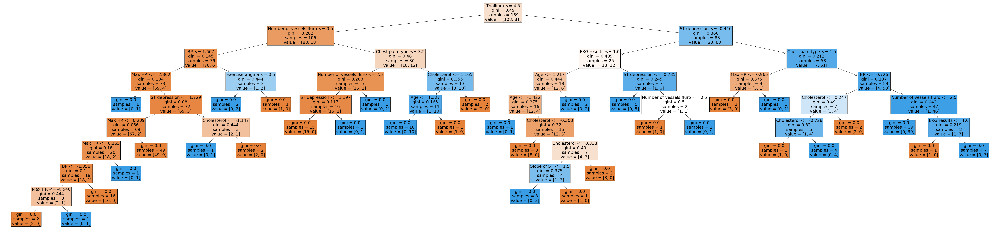

In [21]:
#@title Visualizing the Tree


plt.figure(figsize=(95,22))  # Width and height in inches
f_names=list(X.columns) # Feature names
tree.plot_tree(clf, filled=True, feature_names=f_names, fontsize=22) # Plot the tree
plt.show() #Show the decision tree without the rules in plain text

#Hard to read without zooming a lot

## Tuning the Tree (Single Classification)

In [22]:
# Create Decision Tree classifer object by spefifying parameters
# Try using max_depth=3, min_samples_split=100, min_samples_leaf=2, criterion="entropy"
clf = tree.DecisionTreeClassifier(max_depth=3, min_samples_leaf=2, criterion='entropy')

# Train and test the classifier
clf = clf.fit(X_train, y_train) # Train Decision Tree Classifer
y_hat = clf.predict(X_train) # Predict the response for train dataset
y_pred = clf.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

plt.rcParams['figure.dpi'] = 400 # To increase the resolution from 100dpi to 400dpi

# Plot the tree
plt.figure(figsize=(95,22))  # Width and height in inches
f_names=list(X.columns) # Feature names
tree.plot_tree(clf, filled=True, feature_names=f_names) # Plot the tree
plt.show() #Show decision tree without the rules in plain text

Train Accuracy: 0.8677248677248677
Test Accuracy: 0.7901234567901234


In [24]:
    from sklearn.ensemble import RandomForestClassifier
    rf = RandomForestClassifier()
    rf.fit(X_train, y_train)  # Assuming X_train and y_train are your training data

RandomForestClassifier()

In [29]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier

# Initialize lists to store tree importances and impurities
impurities = {"entropy": []}

# Iterate through each tree in the forest (if rf is a RandomForestClassifier)
impurities["entropy"].append(np.mean(estimator.tree_.impurity))

print("Average Entropy:", np.mean(impurities["entropy"]))

Average Entropy: 0.14717708411072764


Precision: 0.7901083457999002
Recall: 0.7901234567901234


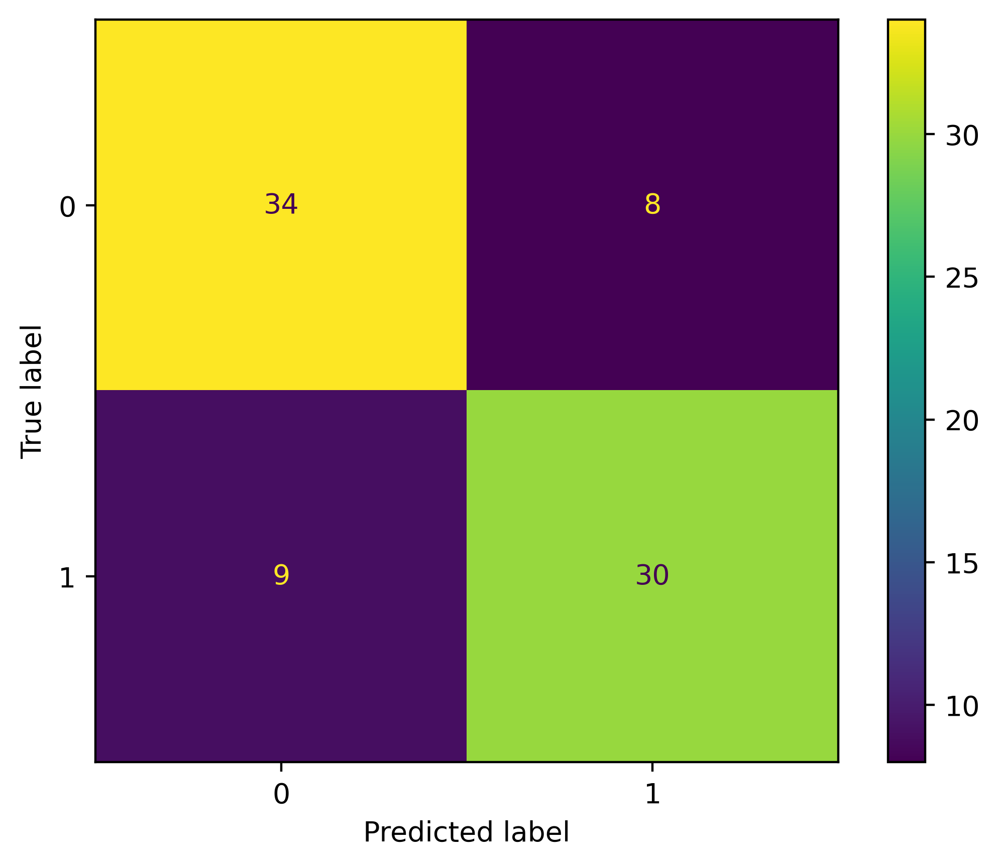

In [30]:
# Additional Evaluation Metrics
print("Precision:", metrics.precision_score(y_test, y_pred, average='weighted'))  # Note - multi-class problem so not straightforward!
print("Recall:", metrics.recall_score(y_test, y_pred, average='weighted'))  # Note - multi-class problem so not straightforward!

# Create the confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)

# Display the confusion matrix
metrics.ConfusionMatrixDisplay(confusion_matrix=cm).plot()
plt.show()

In [31]:
#@title Building the Random Forest

rf = RandomForestClassifier(random_state=100) # Create Fandom Forest classifer object
rf = rf.fit(X_train, y_train) # Train Random Forest Classifer

In [32]:
#@title Evaluating the RF model
y_hat = rf.predict(X_train) # Predict the response for train dataset

y_pred = rf.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 1.0
Test Accuracy: 0.8271604938271605


In [33]:
#@title Visualizing few trees of the RF

f_names=list(X.columns) # Feature names
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(10,2), dpi=3000) # Setup the 1x5 grid for ploting the trees
for index in range(0, 5): # Iterate through the first five trees (of 100)
  tree.plot_tree(rf.estimators_[index], feature_names=f_names, filled = True, ax=axes[index]); # Plot the tree
  axes[index].set_title('Estimator: ' + str(index), fontsize = 11) # Print title

In [34]:

# Initialize lists to store tree importances and impurities
impurities = {"Gini": []}

# Iterate through each tree in the forest
for estimator in rf.estimators_:
    impurities["Gini"].append(estimator.tree_.impurity.mean())

# Print the summary
print("Average Gini:", np.mean(impurities["Gini"]))

Average Gini: 0.16814637608418728


In [35]:
#@title Tuning the RF
# Create RF classifer object by spefifying parameters
# Try using n_estimators=200, max_depth=2
rf = RandomForestClassifier(n_estimators=200, max_depth=2, random_state=0) # Create Random Forest classifer object
rf = rf.fit(X_train, y_train) # Train Random Forest Classifer

# Train and test the classifier
rf = rf.fit(X_train, y_train) # Train Decision Tree Classifer
y_hat = rf.predict(X_train) # Predict the response for train dataset
y_pred = rf.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 0.8571428571428571
Test Accuracy: 0.8271604938271605


In [36]:
#@title Hyperparameter search
param_dist = {'n_estimators': randint(50,1000), 'max_depth': randint(1,20)} #Increasing upper parameter from 500 to 1000 improved accuracy u
rf = RandomForestClassifier() #Creating a random forest classifier
rand_search = RandomizedSearchCV(rf, param_distributions=param_dist, n_iter=5, cv=5) #Using random search to find the best hyperparameters
rand_search.fit(X_train, y_train) #Fitting the random search object to the training data
print('Best hyperparameters:',  rand_search.best_params_)

best_rf = rand_search.best_estimator_ #Capturing the best model
y_hat = best_rf.predict(X_train) #Predicting the response for train dataset
y_pred = best_rf.predict(X_test) #Predicting the response for test dataset

#Computing training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Best hyperparameters: {'max_depth': 16, 'n_estimators': 914}
Train Accuracy: 1.0
Test Accuracy: 0.8148148148148148


Precision: 0.8160493827160493
Recall: 0.8148148148148148


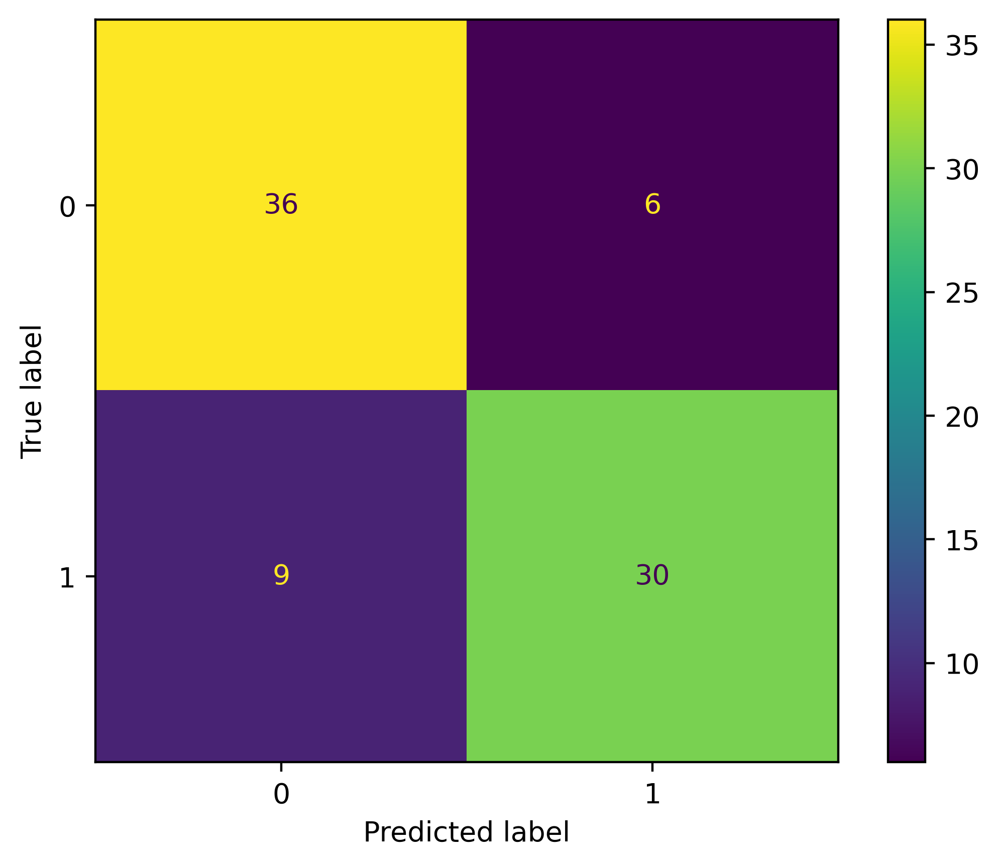

In [37]:
#@title More Evaluation Metrics

print("Precision:", metrics.precision_score(y_test, y_pred, average = 'weighted')) # Note - multi-class problem so not straight forward!
print("Recall:", metrics.recall_score(y_test, y_pred, average = 'weighted')) # Note - multi-class problem so not straight forward!

# Create the confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)
metrics.ConfusionMatrixDisplay(confusion_matrix=cm).plot();


## XGBOOST

In [38]:
# Need to convert categorical to numeric in target variable

y_xgb = y.astype('category').cat.codes

# Splitting dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y_xgb, test_size=0.3, random_state=1) # 70% training and 30% test/valid

In [39]:
bst = XGBClassifier(enable_categorical=True).fit(X_train, y_train)
y_hat = bst.predict(X_train) # Predict the response for train dataset
y_pred = bst.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 1.0
Test Accuracy: 0.7901234567901234


In [40]:
# Hyperparameter optimization
# Experiment with learning rate, number of trees, subsample

bst_hyp = XGBClassifier(enable_categorical=True,
                        learning_rate = 0.05,
                        max_depth = 10,
                        n_estimators = 20,
                        objective='multi:softmax',
                        num_class=3,
                        subsample = 0.8) # Lowering subsample will reduce data available in each tree
bst_hyp_mod = bst_hyp.fit(X_train, y_train)

y_hat = bst_hyp_mod.predict(X_train) # Predict the response for train dataset
y_pred = bst_hyp_mod.predict(X_test) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 0.9735449735449735
Test Accuracy: 0.7901234567901234


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

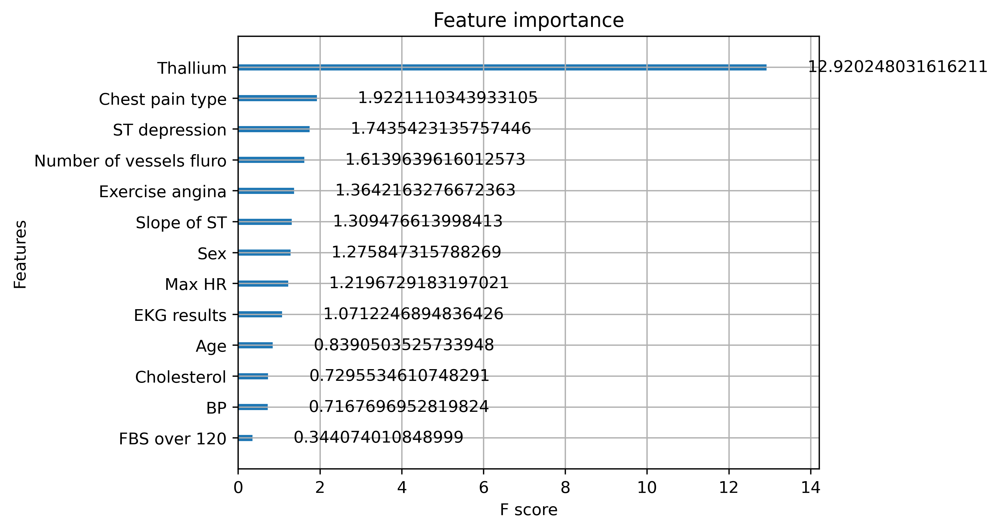

In [41]:
#Feature Importance - helpful way to understand what is driving predictions in tree-based models
# 'gain' shows the average gain of splits which use the feature, 'weight' shows the number of time a feature appears in a tree
plot_importance(bst_hyp_mod, importance_type = 'gain') # try 'weight' to see if the interpretation changes

In [ ]:
## Random forest better than single classification (accur., prec. recall)

Tuning the tree in the single classification provided approximately 86% train accuracy, 79% test accuracy, possibly 17% for the average entropy (not sure if I calculated/interpreted that value correctly; measure of uncertainty), precision of 79% and recall of 79%.

Using a random forest resulted in 93% train accuracy, 85% test accuracy, possibly 17% for the average gini (not sure if I calculated/interpreted that value correctly; measure for impurity), 85% precision, and 85% recall.

I am not quite sure how to interpret confusion matrix tables quite yet, but I suspect additional info could be considered in both the decision tree (single classification) and random forest. I also may have calculated the average gini value for the random forest and accidentally labeled the same value as the average entropy for the single classification decision tree. I am also not an average of either measurement encapsulates the information they convey (e.g., going from one box to another).

However, given that I could not quite see (visibility) or know how to interpret multiple values of gini and entropy or what to do when they with an entire tree (versus from one box to another), the random forest provided better accuracy, precision and recall than the single classification decision tree.


As a side note, XBOOST shows that Thallium is by the biggest indicator for heart disease based on the process I used through the Lab 3 Walkthrough. I will bring this finding for evaluation to my Team #2 partners.